In [1]:
import pandas as pd
import numpy as np
from sklearn.datasets import make_classification

In [2]:
x,y=make_classification(n_samples=50000,n_features=15,random_state=1)

In [3]:
x.shape

(50000, 15)

In [4]:
y.shape

(50000,)

In [5]:
x

array([[ 1.1237645 ,  0.04509426, -0.47834631, ...,  1.74506462,
        -1.12132267, -1.51870105],
       [-1.23556321,  2.11551711, -0.5029657 , ...,  0.19246838,
        -0.15576131, -0.6664598 ],
       [-1.43772553, -0.53814471,  1.55369397, ..., -0.85650357,
        -1.47205619, -2.34454638],
       ...,
       [-0.72050071,  0.29031984,  0.19048198, ..., -0.93357357,
         0.60923303, -0.81624128],
       [ 0.51461835,  0.59305002, -0.80070106, ...,  0.46340872,
         0.92960009,  0.11128984],
       [ 0.61779307,  0.21447809, -1.25595036, ..., -0.62299896,
         0.62603357, -0.26534791]])

In [6]:
y

array([1, 0, 1, ..., 0, 1, 0])

In [7]:
features=pd.DataFrame(x)

In [8]:
features

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,1.123764,0.045094,-0.478346,-0.848602,1.013093,-0.752036,0.368139,0.018146,0.451258,0.741060,-0.698689,0.539523,1.745065,-1.121323,-1.518701
1,-1.235563,2.115517,-0.502966,1.142737,0.374403,0.852784,0.404280,-2.661977,-0.715077,-1.209413,2.173993,0.295909,0.192468,-0.155761,-0.666460
2,-1.437726,-0.538145,1.553694,0.526659,-0.700304,0.893018,-0.779028,1.017429,0.006259,1.315140,-0.191971,-1.135331,-0.856504,-1.472056,-2.344546
3,-1.072972,0.444250,-0.192450,1.307926,-1.595753,0.779583,1.481149,2.067910,-0.950408,1.187062,-0.391959,-1.421077,0.795590,-0.504994,-0.165796
4,0.531433,-0.762543,4.610927,-2.387218,1.928958,-0.601200,-0.087293,1.124810,2.286571,-0.501636,1.843129,1.244087,0.257255,-0.184509,-1.140536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.965936,0.410550,-1.012345,-1.557613,-0.524561,-0.748822,2.754378,0.136500,1.252464,-0.726431,-0.636043,0.087328,-0.754263,-0.177127,-0.533662
49996,-0.577637,-0.766777,-1.040734,2.165769,-1.833776,0.600424,-1.135640,0.625882,-2.037522,0.807268,-1.435850,-0.240582,0.555739,0.063375,0.487370
49997,-0.720501,0.290320,0.190482,1.995407,-1.494915,0.661625,0.510787,1.164903,-1.804420,0.251901,1.738241,-1.581253,-0.933574,0.609233,-0.816241
49998,0.514618,0.593050,-0.800701,-0.372348,1.530371,-0.342378,-2.407420,0.012073,0.189673,0.958287,-1.388916,-1.220476,0.463409,0.929600,0.111290


In [9]:
features.to_csv('data.csv')

In [10]:
classes=pd.DataFrame(y)

In [11]:
classes

,0
0,1
1,0
2,1
3,0
4,1
...,...
49995,1
49996,0
49997,0
49998,1


# train_test_split

In [12]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(x,y,train_size=.65,random_state=100)

In [13]:
xtrain.shape

(32500, 15)

In [14]:
xtest.shape

(17500, 15)

In [15]:
train_scores=[]
test_scores=[]

depth=[n for n in range(1,15)]

In [16]:
depth

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

In [17]:
from sklearn.tree import DecisionTreeClassifier

In [18]:
for i in depth:
    dt=DecisionTreeClassifier(max_depth=i)
    dt.fit(xtrain,ytrain)
    
    #train accuracy
    train_prediction=dt.predict(xtrain)
    train_accuracy=dt.score(xtrain,ytrain)
    train_scores.append(train_accuracy)
    
    
    #testing accuracy
    test_prediction=dt.predict(xtest)
    test_accuracy=dt.score(xtest,ytest)
    test_scores.append(test_accuracy)
    print('Depth = %d, Testing Accuracy = %f,Training Accuracy = %f' %(i,test_accuracy,train_accuracy))

Depth = 1, Testing Accuracy = 0.873886,Training Accuracy = 0.874154
Depth = 2, Testing Accuracy = 0.873886,Training Accuracy = 0.874154
Depth = 3, Testing Accuracy = 0.898057,Training Accuracy = 0.895815
Depth = 4, Testing Accuracy = 0.918343,Training Accuracy = 0.918154
Depth = 5, Testing Accuracy = 0.921314,Training Accuracy = 0.922738
Depth = 6, Testing Accuracy = 0.927314,Training Accuracy = 0.929415
Depth = 7, Testing Accuracy = 0.928457,Training Accuracy = 0.933108
Depth = 8, Testing Accuracy = 0.927200,Training Accuracy = 0.937785
Depth = 9, Testing Accuracy = 0.927143,Training Accuracy = 0.943877
Depth = 10, Testing Accuracy = 0.925029,Training Accuracy = 0.949169
Depth = 11, Testing Accuracy = 0.924457,Training Accuracy = 0.955138
Depth = 12, Testing Accuracy = 0.921029,Training Accuracy = 0.961231
Depth = 13, Testing Accuracy = 0.914514,Training Accuracy = 0.967200
Depth = 14, Testing Accuracy = 0.913943,Training Accuracy = 0.972585


In [19]:
train_scores

[0.8741538461538462,
 0.8741538461538462,
 0.8958153846153846,
 0.9181538461538462,
 0.9227384615384615,
 0.9294153846153846,
 0.9331076923076923,
 0.9377846153846154,
 0.9438769230769231,
 0.9491692307692308,
 0.9551384615384615,
 0.9612307692307692,
 0.9672,
 0.9725846153846154]

In [20]:
test_scores

[0.8738857142857143,
 0.8738857142857143,
 0.8980571428571429,
 0.9183428571428571,
 0.9213142857142858,
 0.9273142857142858,
 0.9284571428571429,
 0.9272,
 0.9271428571428572,
 0.9250285714285714,
 0.9244571428571429,
 0.9210285714285714,
 0.9145142857142857,
 0.9139428571428572]

In [21]:
len(depth)

14

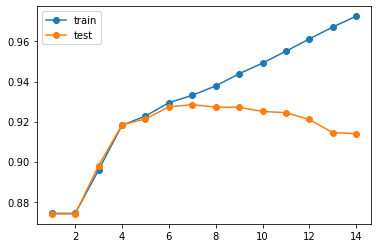

In [22]:
from matplotlib import pyplot as plt
plt.plot(depth,train_scores,'-o',label='train')
plt.plot(depth,test_scores,'-o',label='test')
plt.legend()


In [24]:
train_scores=[]
test_scores=[]

depth=[n for n in range(1,40)]

In [25]:
for i in depth:
    dt=DecisionTreeClassifier(max_depth=i)
    dt.fit(xtrain,ytrain)
    
    #train accuracy
    train_prediction=dt.predict(xtrain)
    train_accuracy=dt.score(xtrain,ytrain)
    train_scores.append(train_accuracy)
    
    
    #testing accuracy
    test_prediction=dt.predict(xtest)
    test_accuracy=dt.score(xtest,ytest)
    test_scores.append(test_accuracy)
    print('Depth = %d, Testing Accuracy = %f,Training Accuracy = %f' %(i,test_accuracy,train_accuracy))

Depth = 1, Testing Accuracy = 0.873886,Training Accuracy = 0.874154
Depth = 2, Testing Accuracy = 0.873886,Training Accuracy = 0.874154
Depth = 3, Testing Accuracy = 0.898057,Training Accuracy = 0.895815
Depth = 4, Testing Accuracy = 0.918343,Training Accuracy = 0.918154
Depth = 5, Testing Accuracy = 0.921314,Training Accuracy = 0.922738
Depth = 6, Testing Accuracy = 0.927314,Training Accuracy = 0.929415
Depth = 7, Testing Accuracy = 0.928629,Training Accuracy = 0.933108
Depth = 8, Testing Accuracy = 0.927371,Training Accuracy = 0.937785
Depth = 9, Testing Accuracy = 0.927029,Training Accuracy = 0.943877
Depth = 10, Testing Accuracy = 0.925429,Training Accuracy = 0.949200
Depth = 11, Testing Accuracy = 0.923829,Training Accuracy = 0.955077
Depth = 12, Testing Accuracy = 0.919657,Training Accuracy = 0.961169
Depth = 13, Testing Accuracy = 0.915600,Training Accuracy = 0.967200
Depth = 14, Testing Accuracy = 0.913086,Training Accuracy = 0.972615
Depth = 15, Testing Accuracy = 0.911486,Tra

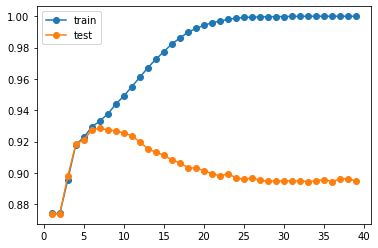

In [26]:
from matplotlib import pyplot as plt
plt.plot(depth,train_scores,'-o',label='train')
plt.plot(depth,test_scores,'-o',label='test')
plt.legend()


In [27]:
train_scores=[]
test_scores=[]

#depth=[n for n in range(1,40)]
depth=np.random.randint(2,15,20)

In [28]:
depth

array([12, 10, 12,  3,  4,  5, 14,  2, 11,  4, 11,  7,  4,  9, 10, 11,  2,
       13, 14,  4])

In [29]:
for i in depth:
    dt=DecisionTreeClassifier(max_depth=i)
    dt.fit(xtrain,ytrain)
    
    #train accuracy
    train_prediction=dt.predict(xtrain)
    train_accuracy=dt.score(xtrain,ytrain)
    train_scores.append(train_accuracy)
    
    
    #testing accuracy
    test_prediction=dt.predict(xtest)
    test_accuracy=dt.score(xtest,ytest)
    test_scores.append(test_accuracy)
    print('Depth = %d, Testing Accuracy = %f,Training Accuracy = %f' %(i,test_accuracy,train_accuracy))

Depth = 12, Testing Accuracy = 0.919600,Training Accuracy = 0.961231
Depth = 10, Testing Accuracy = 0.925371,Training Accuracy = 0.949108
Depth = 12, Testing Accuracy = 0.920457,Training Accuracy = 0.961231
Depth = 3, Testing Accuracy = 0.898057,Training Accuracy = 0.895815
Depth = 4, Testing Accuracy = 0.918343,Training Accuracy = 0.918154
Depth = 5, Testing Accuracy = 0.921314,Training Accuracy = 0.922738
Depth = 14, Testing Accuracy = 0.913714,Training Accuracy = 0.972585
Depth = 2, Testing Accuracy = 0.873886,Training Accuracy = 0.874154
Depth = 11, Testing Accuracy = 0.923771,Training Accuracy = 0.955077
Depth = 4, Testing Accuracy = 0.918343,Training Accuracy = 0.918154
Depth = 11, Testing Accuracy = 0.924800,Training Accuracy = 0.955138
Depth = 7, Testing Accuracy = 0.928571,Training Accuracy = 0.933108
Depth = 4, Testing Accuracy = 0.918343,Training Accuracy = 0.918154
Depth = 9, Testing Accuracy = 0.927143,Training Accuracy = 0.943877
Depth = 10, Testing Accuracy = 0.925029,Tr

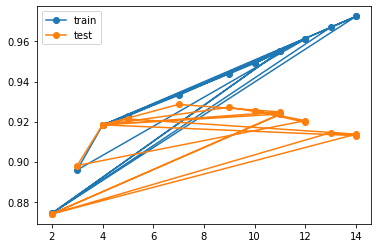

In [30]:
from matplotlib import pyplot as plt
plt.plot(depth,train_scores,'-o',label='train')
plt.plot(depth,test_scores,'-o',label='test')
plt.legend()


In [31]:
train_scores

[0.9612307692307692,
 0.9491076923076923,
 0.9612307692307692,
 0.8958153846153846,
 0.9181538461538462,
 0.9227384615384615,
 0.9725846153846154,
 0.8741538461538462,
 0.955076923076923,
 0.9181538461538462,
 0.9551384615384615,
 0.9331076923076923,
 0.9181538461538462,
 0.9438769230769231,
 0.9491384615384615,
 0.955076923076923,
 0.8741538461538462,
 0.9671384615384615,
 0.9724923076923077,
 0.9181538461538462]

In [32]:
test_scores

[0.9196,
 0.9253714285714286,
 0.9204571428571429,
 0.8980571428571429,
 0.9183428571428571,
 0.9213142857142858,
 0.9137142857142857,
 0.8738857142857143,
 0.9237714285714286,
 0.9183428571428571,
 0.9248,
 0.9285714285714286,
 0.9183428571428571,
 0.9271428571428572,
 0.9250285714285714,
 0.9235428571428571,
 0.8738857142857143,
 0.9144571428571429,
 0.9129714285714285,
 0.9183428571428571]

In [33]:
train_scores=[]
test_scores=[]

criterion = ['gini','entropy']

In [34]:
for i in criterion:
    dt=DecisionTreeClassifier(criterion=i)
    dt.fit(xtrain,ytrain)
    
    #train accuracy
    train_prediction=dt.predict(xtrain)
    train_accuracy=dt.score(xtrain,ytrain)
    train_scores.append(train_accuracy)
    
    
    #testing accuracy
    test_prediction=dt.predict(xtest)
    test_accuracy=dt.score(xtest,ytest)
    test_scores.append(test_accuracy)
    print(i,train_scores,test_scores)
    #print('Depth = %d, Testing Accuracy = %f,Training Accuracy = %f' %(i,test_accuracy,train_accuracy))

gini [1.0] [0.8962285714285714]
entropy [1.0, 1.0] [0.8962285714285714, 0.8994285714285715]


In [35]:
import seaborn as sns

In [36]:
df=pd.read_csv('credit card.csv')

In [37]:
df

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000.0,1,3,1,39,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,29997,150000.0,1,3,2,43,-1,-1,-1,-1,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,29998,30000.0,1,2,2,37,4,3,2,-1,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,29999,80000.0,1,3,1,41,1,-1,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


In [38]:
df.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month'],
      dtype='object')

In [39]:
df.columns.value_counts()

ID                            1
BILL_AMT2                     1
PAY_AMT6                      1
PAY_AMT5                      1
PAY_AMT4                      1
PAY_AMT3                      1
PAY_AMT2                      1
PAY_AMT1                      1
BILL_AMT6                     1
BILL_AMT5                     1
BILL_AMT4                     1
BILL_AMT3                     1
BILL_AMT1                     1
LIMIT_BAL                     1
PAY_6                         1
PAY_5                         1
PAY_4                         1
PAY_3                         1
PAY_2                         1
PAY_0                         1
AGE                           1
MARRIAGE                      1
EDUCATION                     1
SEX                           1
default.payment.next.month    1
dtype: int64

In [40]:
df.shape

(30000, 25)

In [41]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [42]:
df=df.rename(columns={'default.payment.next.month':'payment'})

In [43]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [44]:
x=df.drop(['ID','payment'],axis=1)

In [45]:
y=df['payment']

In [46]:
train_scores=[]
test_scores=[]

depth=[n for n in range(1,15)]

In [47]:
for i in depth:
    dt=DecisionTreeClassifier(max_depth=i)
    dt.fit(xtrain,ytrain)
    
    #train accuracy
    train_prediction=dt.predict(xtrain)
    train_accuracy=dt.score(xtrain,ytrain)
    train_scores.append(train_accuracy)
    
    
    #testing accuracy
    test_prediction=dt.predict(xtest)
    test_accuracy=dt.score(xtest,ytest)
    test_scores.append(test_accuracy)
    print('Depth = %d, Testing Accuracy = %f,Training Accuracy = %f' %(i,test_accuracy,train_accuracy))

Depth = 1, Testing Accuracy = 0.873886,Training Accuracy = 0.874154
Depth = 2, Testing Accuracy = 0.873886,Training Accuracy = 0.874154
Depth = 3, Testing Accuracy = 0.898057,Training Accuracy = 0.895815
Depth = 4, Testing Accuracy = 0.918343,Training Accuracy = 0.918154
Depth = 5, Testing Accuracy = 0.921314,Training Accuracy = 0.922738
Depth = 6, Testing Accuracy = 0.927314,Training Accuracy = 0.929415
Depth = 7, Testing Accuracy = 0.928686,Training Accuracy = 0.933108
Depth = 8, Testing Accuracy = 0.927600,Training Accuracy = 0.937785
Depth = 9, Testing Accuracy = 0.926400,Training Accuracy = 0.943846
Depth = 10, Testing Accuracy = 0.925714,Training Accuracy = 0.949138
Depth = 11, Testing Accuracy = 0.924000,Training Accuracy = 0.955077
Depth = 12, Testing Accuracy = 0.919886,Training Accuracy = 0.961231
Depth = 13, Testing Accuracy = 0.914800,Training Accuracy = 0.967138
Depth = 14, Testing Accuracy = 0.913886,Training Accuracy = 0.972554


In [49]:
train_scores

[0.8741538461538462,
 0.8741538461538462,
 0.8958153846153846,
 0.9181538461538462,
 0.9227384615384615,
 0.9294153846153846,
 0.9331076923076923,
 0.9377846153846154,
 0.9438461538461539,
 0.9491384615384615,
 0.955076923076923,
 0.9612307692307692,
 0.9671384615384615,
 0.9725538461538461]

In [50]:
test_scores

[0.8738857142857143,
 0.8738857142857143,
 0.8980571428571429,
 0.9183428571428571,
 0.9213142857142858,
 0.9273142857142858,
 0.9286857142857143,
 0.9276,
 0.9264,
 0.9257142857142857,
 0.924,
 0.9198857142857143,
 0.9148,
 0.9138857142857143]

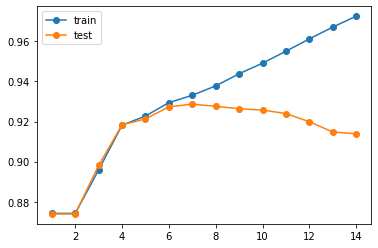

In [51]:
from matplotlib import pyplot as plt
plt.plot(depth,train_scores,'-o',label='train')
plt.plot(depth,test_scores,'-o',label='test')
plt.legend()


In [54]:
import seaborn as sns
df=pd.read_csv('credit card.csv')

In [55]:
df

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000.0,1,3,1,39,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,29997,150000.0,1,3,2,43,-1,-1,-1,-1,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,29998,30000.0,1,2,2,37,4,3,2,-1,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,29999,80000.0,1,3,1,41,1,-1,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


In [56]:
df.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month'],
      dtype='object')

In [57]:
df.columns.value_counts

<bound method IndexOpsMixin.value_counts of Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month'],
      dtype='object')>

In [58]:
df.shape

(30000, 25)

In [59]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [60]:
df=df.rename(columns={'default.payment.next.month':'payment'})

In [61]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [62]:
x=df.drop(['ID','payment'],axis=1)

In [63]:
y=df['payment']

In [64]:
x

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,1,3,1,39,0,0,0,0,0,...,208365.0,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0
29996,150000.0,1,3,2,43,-1,-1,-1,-1,0,...,3502.0,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0
29997,30000.0,1,2,2,37,4,3,2,-1,0,...,2758.0,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0
29998,80000.0,1,3,1,41,1,-1,0,0,0,...,76304.0,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0


In [65]:
y

0        1
1        1
2        0
3        0
4        0
        ..
29995    0
29996    0
29997    1
29998    1
29999    1
Name: payment, Length: 30000, dtype: int64

In [1]:
df.shape

NameError: name 'df' is not defined

# Extra Trees Classifier

In [66]:
from sklearn.ensemble import ExtraTreesClassifier  #decision tree
extra=ExtraTreesClassifier()

In [67]:
extra.fit(x,y)

ExtraTreesClassifier()

In [68]:
feature_importance=extra.feature_importances_
feature_importance

array([0.06656676, 0.01161532, 0.0328251 , 0.02202288, 0.06696723,
       0.09654847, 0.04847934, 0.03397182, 0.0286529 , 0.02935967,
       0.03002114, 0.05005078, 0.04658081, 0.04537682, 0.04444587,
       0.04322352, 0.04409251, 0.04439247, 0.04232851, 0.041942  ,
       0.04110891, 0.04298195, 0.04644522])

In [69]:
imp=pd.DataFrame(feature_importance,columns=['Gain_score'])

In [70]:
imp.head(10)

,Gain_score
0,0.066567
1,0.011615
2,0.032825
3,0.022023
4,0.066967
5,0.096548
6,0.048479
7,0.033972
8,0.028653
9,0.029360


In [71]:
imp.head(15)

,Gain_score
0,0.066567
1,0.011615
2,0.032825
3,0.022023
4,0.066967
5,0.096548
6,0.048479
7,0.033972
8,0.028653
9,0.029360


In [72]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

# column concatenation

In [73]:
cols=pd.DataFrame(x.columns,columns=['Feature_Names'])

In [74]:
cols.head(15)

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE
5,PAY_0
6,PAY_2
7,PAY_3
8,PAY_4
9,PAY_5


In [75]:
gains=pd.concat([cols,imp],axis=1)
gains

,Feature_Names,Gain_score
0,LIMIT_BAL,0.066567
1,SEX,0.011615
2,EDUCATION,0.032825
3,MARRIAGE,0.022023
4,AGE,0.066967
5,PAY_0,0.096548
6,PAY_2,0.048479
7,PAY_3,0.033972
8,PAY_4,0.028653
9,PAY_5,0.029360


In [76]:
gains.nlargest(15,'Gain_score')

,Feature_Names,Gain_score
5,PAY_0,0.096548
4,AGE,0.066967
0,LIMIT_BAL,0.066567
11,BILL_AMT1,0.050051
6,PAY_2,0.048479
12,BILL_AMT2,0.046581
22,PAY_AMT6,0.046445
13,BILL_AMT3,0.045377
14,BILL_AMT4,0.044446
17,PAY_AMT1,0.044392


In [77]:
gains.nlargest(22,'Gain_score')

,Feature_Names,Gain_score
5,PAY_0,0.096548
4,AGE,0.066967
0,LIMIT_BAL,0.066567
11,BILL_AMT1,0.050051
6,PAY_2,0.048479
12,BILL_AMT2,0.046581
22,PAY_AMT6,0.046445
13,BILL_AMT3,0.045377
14,BILL_AMT4,0.044446
17,PAY_AMT1,0.044392


In [78]:
gains.nsmallest(7,'Gain_score')

,Feature_Names,Gain_score
1,SEX,0.011615
3,MARRIAGE,0.022023
8,PAY_4,0.028653
9,PAY_5,0.029360
10,PAY_6,0.030021
2,EDUCATION,0.032825
7,PAY_3,0.033972


In [79]:
newx=gains.nlargest(18,'Gain_score')
newx

,Feature_Names,Gain_score
5,PAY_0,0.096548
4,AGE,0.066967
0,LIMIT_BAL,0.066567
11,BILL_AMT1,0.050051
6,PAY_2,0.048479
12,BILL_AMT2,0.046581
22,PAY_AMT6,0.046445
13,BILL_AMT3,0.045377
14,BILL_AMT4,0.044446
17,PAY_AMT1,0.044392


<AxesSubplot:>

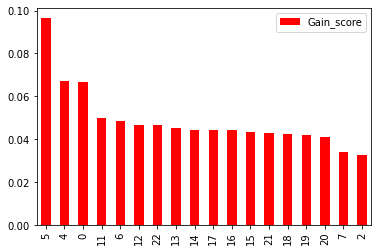

In [80]:
newx.plot(kind='bar',color=['red'])

<AxesSubplot:>

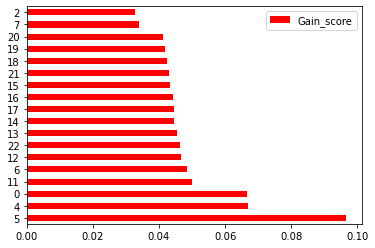

In [81]:
newx.plot(kind='barh',color=['red'])

In [82]:
x.shape

(30000, 23)

In [83]:
import matplotlib.pyplot as plt

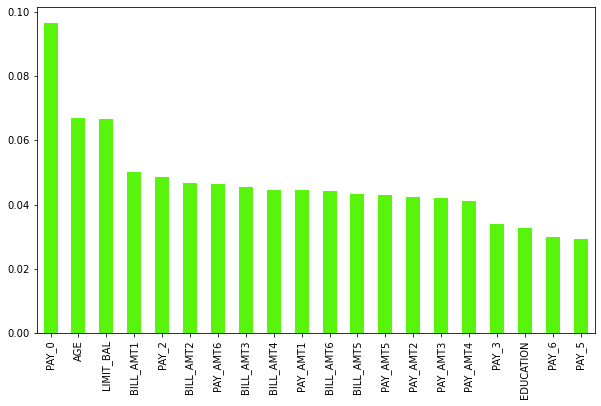

In [84]:
features=pd.Series(extra.feature_importances_,index=x.columns)
plt.figure(figsize=(10,6))
features.nlargest(20).plot(kind='bar',color='#59f40b')
plt.savefig('score1.png')

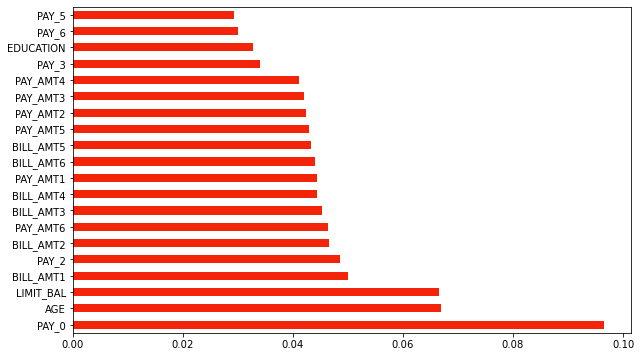

In [85]:
features=pd.Series(extra.feature_importances_,index=x.columns)
plt.figure(figsize=(10,6))
features.nlargest(20).plot(kind='barh',color='#f4240b')
plt.savefig('score2.png')

In [86]:
#x=newx
x.corr()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
LIMIT_BAL,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,-0.249411,...,0.283236,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595
SEX,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,-0.055064,...,-0.024563,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766
EDUCATION,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,0.097520,...,0.013002,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200
MARRIAGE,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,0.035629,...,-0.024909,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641
AGE,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,-0.053826,...,0.053710,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478
PAY_0,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,0.509426,...,0.179785,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673
PAY_2,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,0.622780,...,0.224146,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500
PAY_3,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,0.686775,...,0.227494,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861
PAY_4,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,0.819835,...,0.244983,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565
PAY_5,-0.249411,-0.055064,0.097520,0.035629,-0.053826,0.509426,0.622780,0.686775,0.819835,1.000000,...,0.243335,0.271915,0.269783,0.262509,-0.006089,-0.003191,0.009062,-0.058299,-0.033337,-0.023027


In [87]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

<AxesSubplot:>

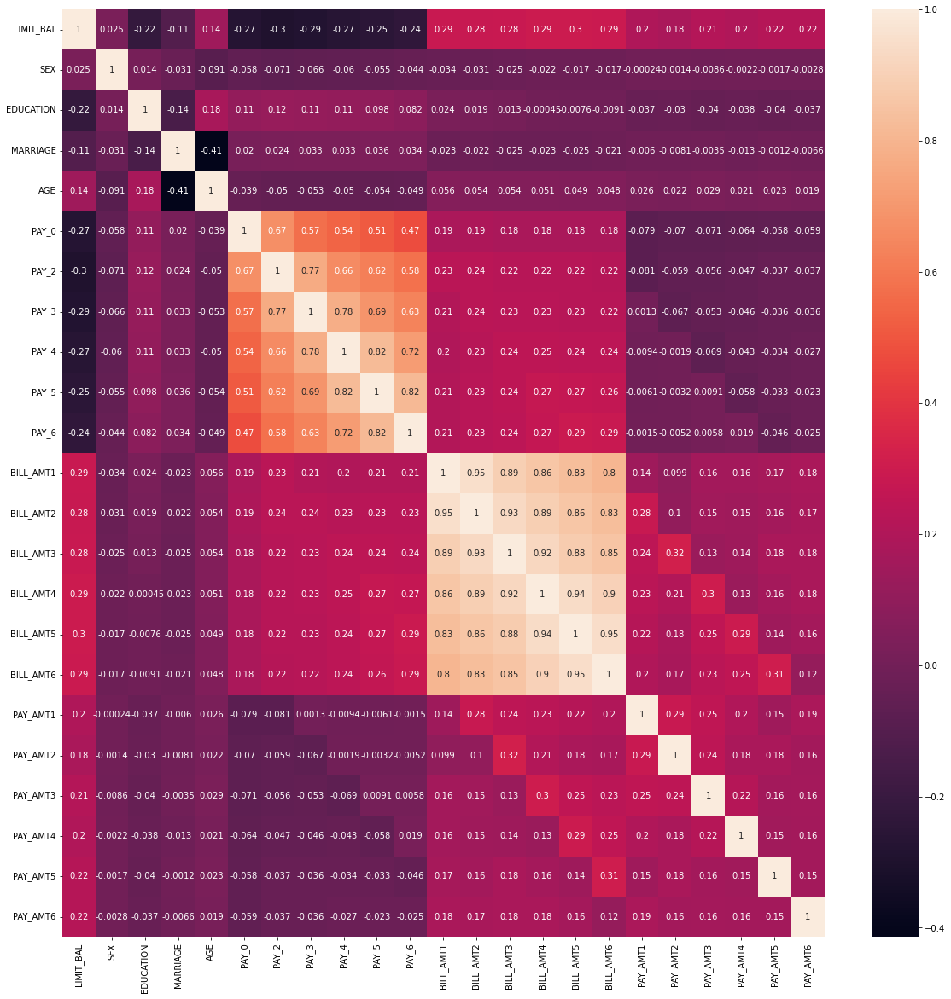

In [88]:
feature_names=x.columns  #features name
colname=x.corr().index#feature name
plt.figure(figsize=(20,20))
sns.heatmap(df[colname].corr(),annot=True)

<AxesSubplot:>

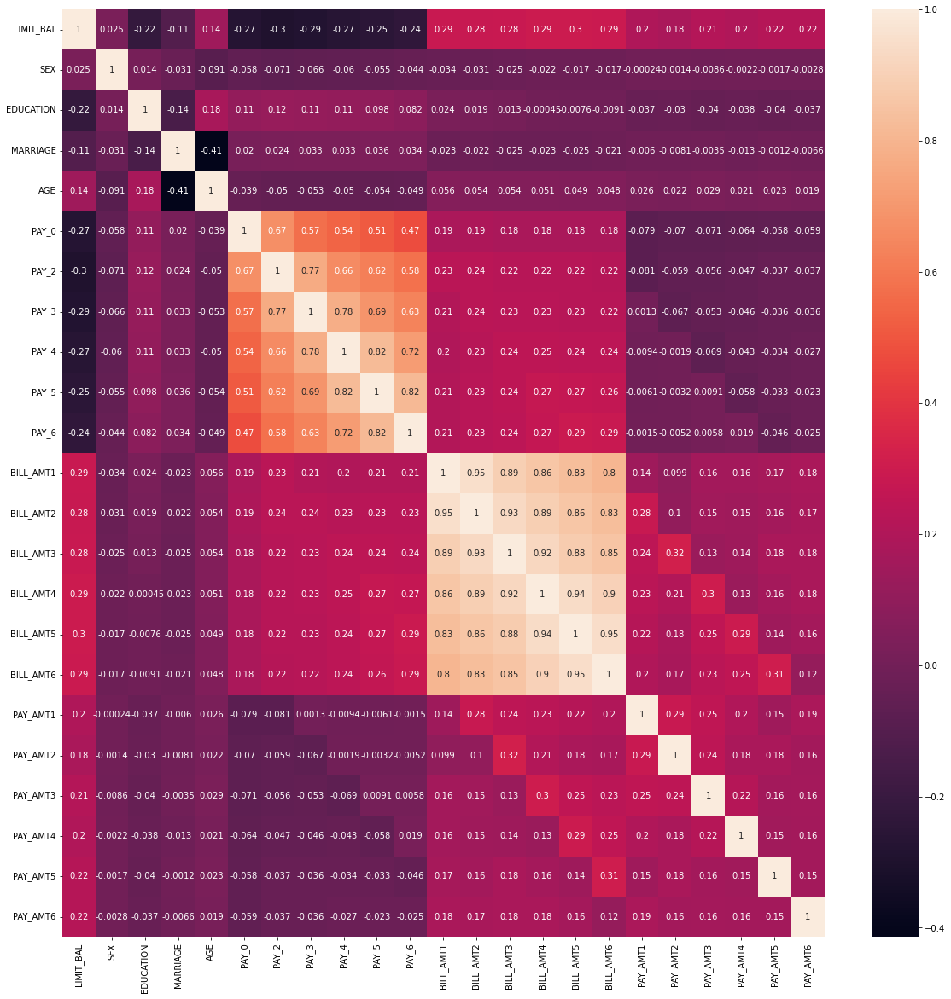

In [89]:
feature_names=x.columns  #features name
colname=x.corr().index#feature name
plt.figure(figsize=(20,20))
sns.heatmap(df[feature_names].corr(),annot=True)

# select k best

In [90]:
df=pd.read_csv('credit card.csv')
df=df.rename(columns={'default.payment.next.month':'payment'})
x=df.drop(['ID','payment'],axis=1)
y=df['payment']

In [91]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [92]:
from sklearn.feature_selection import SelectKBest,f_classif,chi2  #chi2 is only when features are no -ve

In [93]:
model2=SelectKBest(score_func=f_classif)#best on ANOVA

In [94]:
feature_score=model2.fit(x,y)

In [95]:
feature_score.scores_

array([7.24068539e+02, 4.79788543e+01, 2.35471118e+01, 1.77812714e+01,
       5.78855582e+00, 3.53771497e+03, 2.23916914e+03, 1.75746644e+03,
       1.47684597e+03, 1.30459118e+03, 1.08540249e+03, 1.15805315e+01,
       6.04423789e+00, 5.94438771e+00, 3.09474518e+00, 1.37108740e+00,
       8.65820292e-01, 1.60403810e+02, 1.03291524e+02, 9.52180109e+01,
       9.71880005e+01, 9.14298008e+01, 8.50890453e+01])

In [96]:
cols=pd.DataFrame(feature_score.scores_,columns=['Feature_Scores'])

In [97]:
cols

,Feature_Scores
0,724.068539
1,47.978854
2,23.547112
3,17.781271
4,5.788556
5,3537.714970
6,2239.169136
7,1757.466444
8,1476.845967
9,1304.591176


In [98]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [99]:
col2=pd.DataFrame(x.columns,columns=['Feature_Names'])

In [100]:
col2.head()

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE


# concatenation

In [101]:
scores=pd.concat([col2,cols],axis=1)
scores

,Feature_Names,Feature_Scores
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [102]:
scores.nlargest(15,'Feature_Scores')

,Feature_Names,Feature_Scores
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


In [103]:
len(x.columns)

23

In [104]:
newx=scores.nlargest(10,'Feature_Scores')
newx

,Feature_Names,Feature_Scores
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


# principle component analysis

In [ ]:
df=pd.read_csv('credit card.csv')
df=df.rename(columns={'default.payment.next.month':'payment'})
x=df.drop(['ID','payment'],axis=1)
y=df['payment']

In [ ]:
x

# Feature sceling for pca

In [106]:
from sklearn.preprocessing import MinMaxScaler
mmx=MinMaxScaler() #feature range=(2,5)

In [107]:
scaled_x=mmx.fit_transform(x)

In [108]:
scaled_x.shape

(30000, 23)

In [109]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

In [110]:
from sklearn.decomposition import PCA

In [111]:
pca=PCA(n_components=3)
x_pca=pca.fit_transform(scaled_x)

In [112]:
x_pca

array([[-0.40423245, -0.00800476, -0.00259672],
       [-0.39188881,  0.209224  , -0.19698761],
       [-0.39264215,  0.08409527, -0.12656657],
       ...,
       [ 0.62351265,  0.33728838, -0.08489174],
       [ 0.60374479, -0.01953151,  0.21421124],
       [ 0.60917214,  0.00997409,  0.23321987]])

In [113]:
features=pd.DataFrame(x_pca,columns=['pca1','pca2','pca3'])
features

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196988
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445
...,...,...,...
29995,0.605245,0.027127,0.231678
29996,0.601275,-0.132858,-0.028314
29997,0.623513,0.337288,-0.084892
29998,0.603745,-0.019532,0.214211


In [ ]:
!pip install plotly

In [114]:
import plotly.express as ps
ps.scatter_3d(features,x='pca1',y='pca2',z='pca3',color='pca1')